# TRABAJO FINAL INTELIGENCIA ARTIFICIAL-BIOELECTRÓNICA

*Ing. Fransisco Salgado - Ing. Omar Alvarado*

**INTEGRANTES:**
López Matias - Ortiz Edisson - Patiño Gustavo - Proaño Darío

# *Tema: Entrenamiento por medio de inteligencia artificial para la detección de Pólipos*

# PÓLIPOS

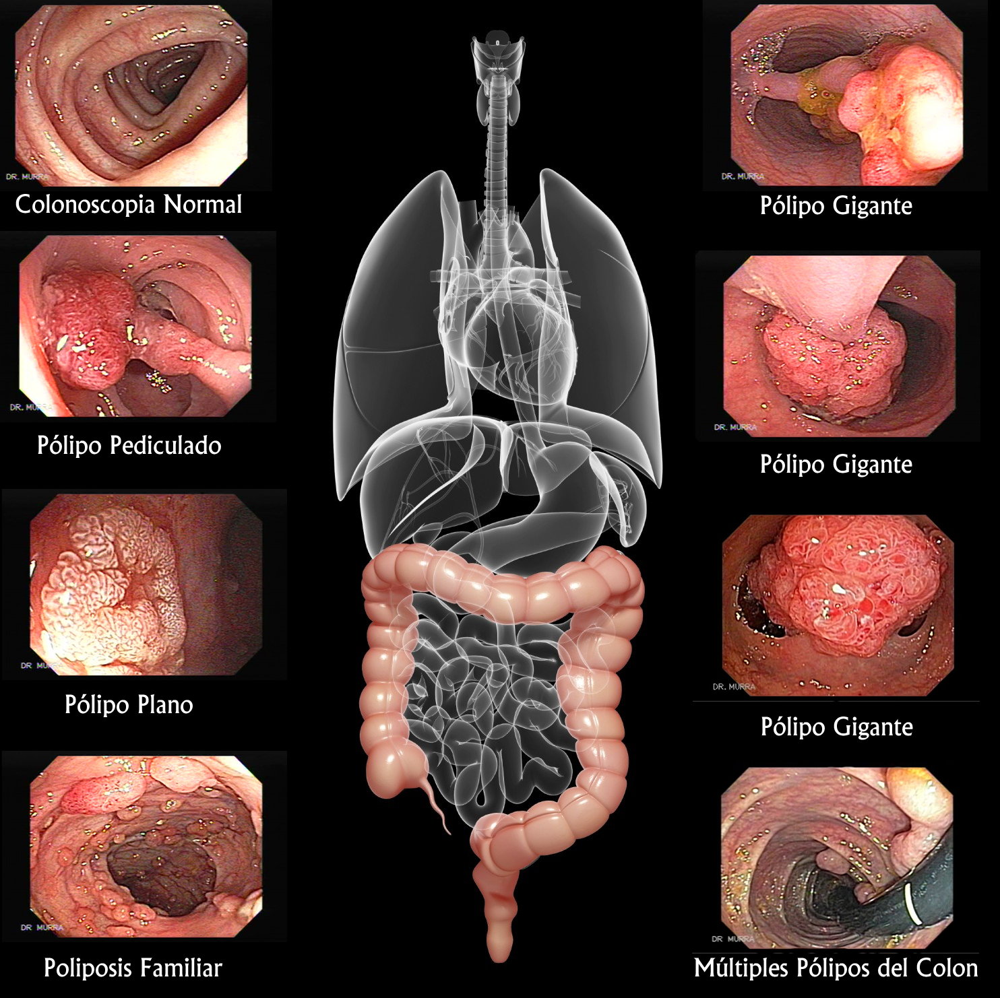

Un pólipo es una parte de tejido adicional que crece dentro del cuerpo. Los pólipos de colon crecen en el intestino grueso o colon. La mayoría de los pólipos no son peligrosos. Sin embargo, ciertos pólipos pueden convertirse en cancerosos o ya ser cáncer. Como medida de seguridad, los médicos extirpan los pólipos y los examinan.

Cualquier persona puede tener pólipos, pero algunas tienen más probabilidades que otras. La mayoría de los cánceres de colon no causa síntomas. Si tiene síntomas, éstos pueden incluir la presencia de sangre en la ropa interior o el papel higiénico después de evacuar, sangre en las heces o estreñimiento o diarrea que perdura más de una semana.

# Tratamiento Computalizado

La colonografía por tomografía computarizada (TC) o colonoscopia virtual utiliza un equipo especial de rayos X para examinar el intestino grueso para identificar cáncer y crecimientos llamados pólipos. Durante el examen, el médico inserta un pequeño tubo por una distancia corta adentro del recto.

# El presente proyecto consiste en:

**Se realizó un entrenamiento basado en la detección de objetos a través de inteligencia artificial, el cual se aplicó en la rama de biomedicina para detectar por tomografía computarizada la localización de pólipos que son crecimientos adheridos en las paredes del organismo. La detección de estas deformaciones en el cuerpo se realizó atreves de YOLO, que es una red neuronal con la posibilidad de procesar los modelos a partir de imágenes, mismas que facilitaran al profesional su ubicación antes de que estos se vuelvan cancerosos.**

**YOLOV5**

La red seleccionada para el proyecto es la YOLOv5x ya que es la más compleja suministrando una leve mejora de fotogramas cuando la carga de localizaciones es muy grande y tiene un rendimiento superior sobre las otras al momento del aprendizaje para la detección de objetos 


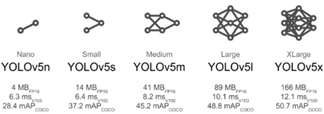

Se ocupó YOLOv5x ya que la curva característica es mucho más estable que sus otras versiones dando como resultado un entrenamiento más eficiente y a la hora de ingresar datos exteriores obtener así una eficiencia con resultados óptimos para una correcta determinación que en este caso será la detección de pólipos 

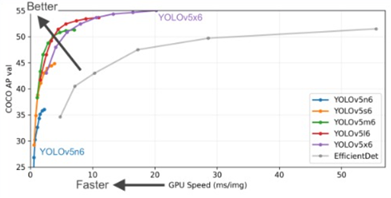


**Diagrama de Bloques**
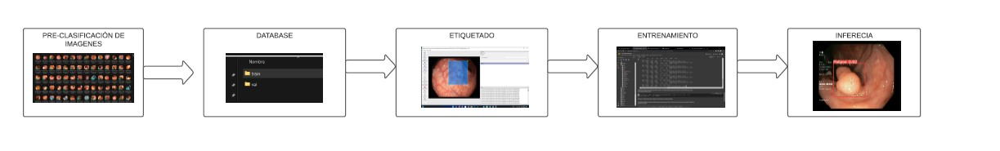
                    

Dicho proyecto se desarrolló en cinco etapas fundamentales, donde se realizará una preclasificación de las imagenes, para la implementación de un dataset para almacenar un conjunto de imágenes de pólipos los cuales son el objeto a detectar, posteriormente se realizó un entrenamiento con el fin de seleccionar un marco de aprendizaje para aplicar una enseñanza en una red neuronal y finalmente se ejecutó una inferencia para poner en práctica el entrenamiento realizado donde se ejecutó el modelo de imágenes con el objetivo de poder así detectar los crecimientos adheridos en el organismo.

# Explicación del Algoritmo

**Como primer punto del algoritmo, es duplicar la carpeta entranada para que esta pueda ser descargada de forma directa en el entorno**

In [3]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install

import torch
import utils
display = utils.notebook_init()  # checks

YOLOv5 🚀 v6.1-312-gb92430a Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla V100-SXM2-16GB, 16160MiB)


Setup complete ✅ (8 CPUs, 51.0 GB RAM, 39.2/166.8 GB disk)


**Para comenzar la segunda parte tenemos que subir al enterno el archio zip en donde se encuentra a imagenes de entrenamiento y valizadcion asi como su etiqueta**

**Una vez cargada la carpeta zip en el entorno, utilizaremos la siguiente linea de codigo para poder descomprimir la misma**

In [4]:
!unzip -q ../train_data.zip -d ../

**La sigueinte linea de codigo es exclusivamente para entrenar nuestro modelo la cual cuenta con un batch que esta estrictamente relacionado con la forma en la que aprende la red neuronal. Las épocas son los ciclos terminados a través de un acumulado de datos de preparación y muestra el monto de autorizaciones que el algoritmo de amaestramiento automático ha completado durante el entrenamiento que va a tener la red neuronal y con ello aumenta la precisión al momento del aprendizaje y por ultimo contamos con el wigths que es la clase de red neuronal que queremos usar en nuestro caso seria la yolov5x para tener un mejor rendimiento del entrenmaiento**

In [7]:
!python train.py --img 640 --batch 10 --epochs 100 --data customdata.yaml --weights yolov5x.pt --cache

train: weights=yolov5x.pt, cfg=, data=customdata.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=10, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-312-gb92430a Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla V100-SXM2-16GB, 16160MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=

**Cargamos las imagenes que tenemos que subir al enterno y en weights tendriamos que poner la mejor ruta de entrenamiento que nos da como resultado del paso anterior**

detect: weights=['runs/train/exp/weights/best.pt'], source=../421.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.75, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-312-gb92430a Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla V100-SXM2-16GB, 16160MiB)

Fusing layers... 
Model summary: 444 layers, 86173414 parameters, 0 gradients, 203.8 GFLOPs
image 1/1 /content/421.jpg: 512x640 1 Polipos, Done. (0.024s)
Speed: 0.6ms pre-process, 24.3ms inference, 1.4ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp3


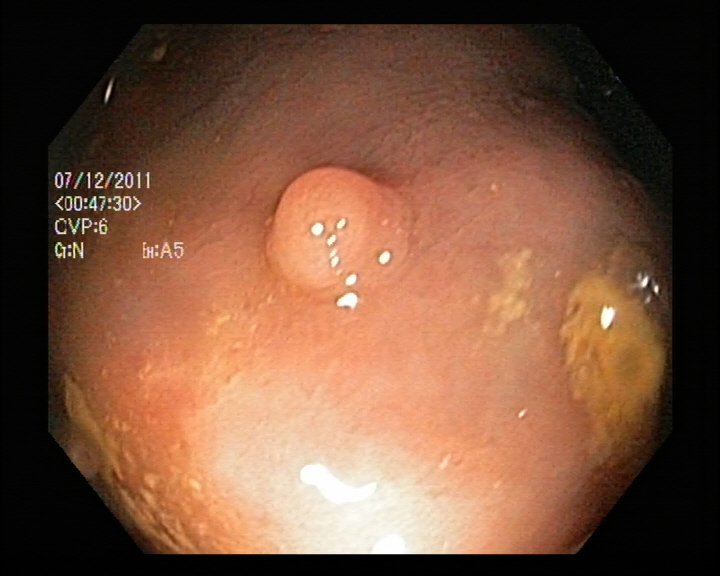

In [10]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.75 --source "../421.jpg" 
display.Image(filename='../421.jpg', width=600)

**Utilzamos TensorBoard para poder visualziar de forma grafica los resultados obtenidos**


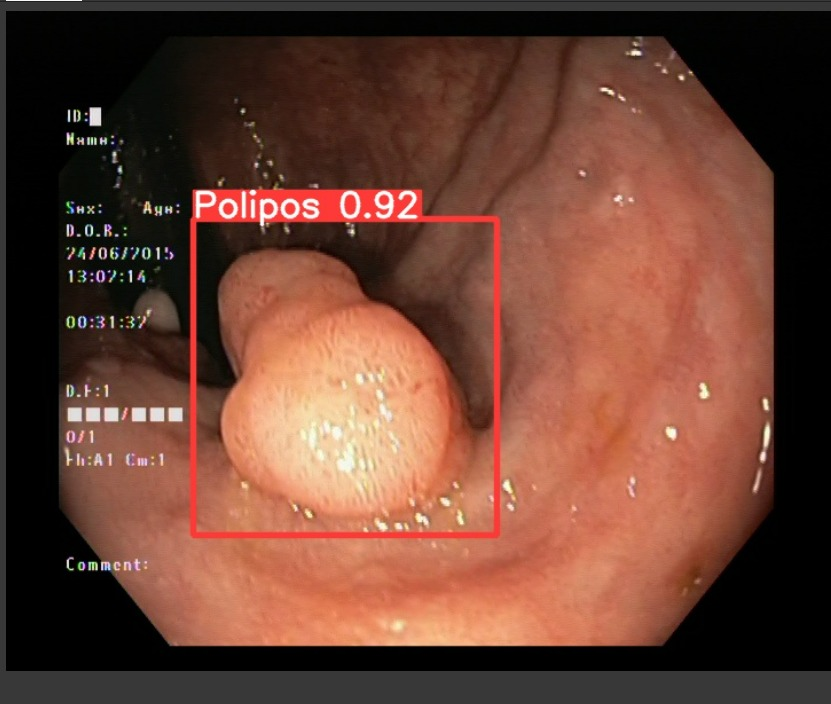


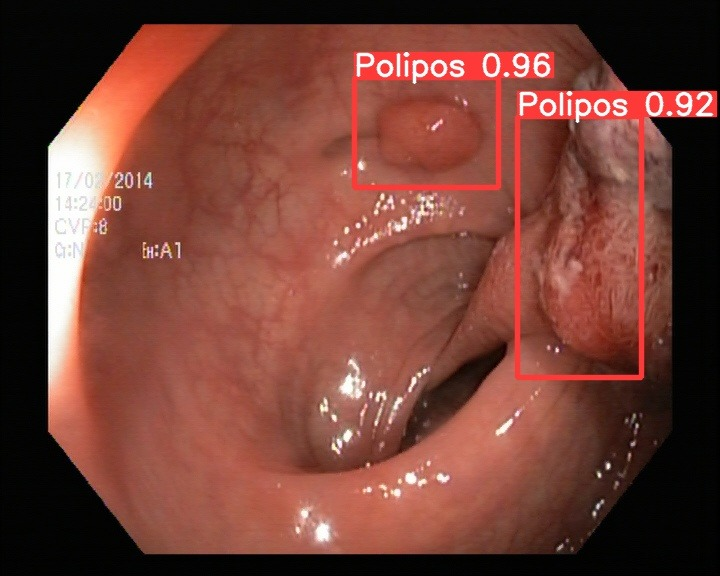

**Para utilizar la libreria de Google TensorBoard lo primero que hacemos es llamar a todo el entorno el cual como ya se mencionó mostrará los datos de forma grafica**


**TensorBoard analiza los datos de la carpeta runs en donde se guardan los resultados de la deteccion de pólipos**

In [11]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

**Matriz de confusión** 

Para visualizar si el efecto obtenido es el óptimo, se verificará atreves de la matriz de confusión la cual nos dará el porcentaje de eficiencia de todas las imágenes ingresadas en un rango de 0 a 1. Si el porcentaje se encuentra entre 0.85 a 1 será un resultado satisfactorio. 


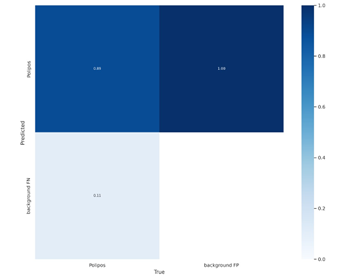

**Curva ROC**

Para determinar la curva de ROC que simboliza la tasa de verdaderos positivos, que es el ratio de pretensiones positivas que se especifican correctamente frente a la tasa de falsos positivos, que es el ratio de instancias negativas que se clasifican erróneamente como positivos 

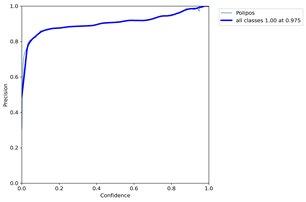

**Área ROC**

Área ROC en un valor cercano a 1 significa que el modelo tiene una alta capacidad de realizar clasificaciones correctas, sin embargo, un valor cercano a 0.5 implica que su capacidad de diferenciación entre clases es nula [2] y la matriz de confusión que se usa para evaluar el rendimiento de un modelo que compara los valores predichos por el sistema con los reales [2].

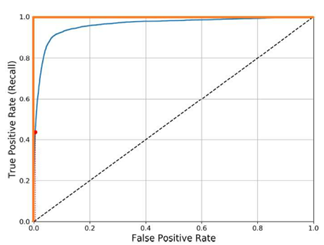